In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
# linear regression

# 1. y should follow normality
# 2. x, y have some linear relationship
# 3. mo outliers in dataset
# 4. no missing values in dataset
# 5. no multicollinearity
# 6. no hetroscedasticity in data

In [20]:
data = pd.read_csv("D:/cancer_reg.csv", )

In [21]:
data.head()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
0,1397.0,469,164.9,489.8,61898,260131,11.2,499.748204,"(61494.5, 125635]",39.3,...,NaN,41.6,32.9,14.0,81.780529,2.594728,4.821857,1.843479,52.856076,6.118831
1,173.0,70,161.3,411.6,48127,43269,18.6,23.111234,"(48021.6, 51046.4]",33.0,...,53.8,43.6,31.1,15.3,89.228509,0.969102,2.246233,3.741352,45.372500,4.333096
2,102.0,50,174.7,349.7,49348,21026,14.6,47.560164,"(48021.6, 51046.4]",45.0,...,43.5,34.9,42.1,21.1,90.922190,0.739673,0.465898,2.747358,54.444868,3.729488
3,427.0,202,194.8,430.4,44243,75882,17.1,342.637253,"(42724.4, 45201]",42.8,...,40.3,35.0,45.3,25.0,91.744686,0.782626,1.161359,1.362643,51.021514,4.603841
4,57.0,26,144.4,350.1,49955,10321,12.5,0.000000,"(48021.6, 51046.4]",48.3,...,43.9,35.1,44.0,22.7,94.104024,0.270192,0.665830,0.492135,54.027460,6.796657


In [22]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   avgAnnCount              3047 non-null   float64
 1   avgDeathsPerYear         3047 non-null   int64  
 2   TARGET_deathRate         3047 non-null   float64
 3   incidenceRate            3047 non-null   float64
 4   medIncome                3047 non-null   int64  
 5   popEst2015               3047 non-null   int64  
 6   povertyPercent           3047 non-null   float64
 7   studyPerCap              3047 non-null   float64
 8   binnedInc                3047 non-null   object 
 9   MedianAge                3047 non-null   float64
 10  MedianAgeMale            3047 non-null   float64
 11  MedianAgeFemale          3047 non-null   float64
 12  Geography                3047 non-null   object 
 13  AvgHouseholdSize         3047 non-null   float64
 14  PercentMarried          

# Explorartory Data Analysis

In [23]:
data.isnull().sum()

avgAnnCount                   0
avgDeathsPerYear              0
TARGET_deathRate              0
incidenceRate                 0
medIncome                     0
popEst2015                    0
povertyPercent                0
studyPerCap                   0
binnedInc                     0
MedianAge                     0
MedianAgeMale                 0
MedianAgeFemale               0
Geography                     0
AvgHouseholdSize              0
PercentMarried                0
PctNoHS18_24                  0
PctHS18_24                    0
PctSomeCol18_24            2285
PctBachDeg18_24               0
PctHS25_Over                  0
PctBachDeg25_Over             0
PctEmployed16_Over          152
PctUnemployed16_Over          0
PctPrivateCoverage            0
PctPrivateCoverageAlone     609
PctEmpPrivCoverage            0
PctPublicCoverage             0
PctPublicCoverageAlone        0
PctWhite                      0
PctBlack                      0
PctAsian                      0
PctOther

In [24]:
data.shape

(3047, 34)

In [26]:
data.size

103598

In [27]:
data.tail(10)

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
3037,1962.667684,16,160.3,453.549422,47599,7797,15.0,0.000000,"(45201, 48021.6]",38.8,...,54.9,45.7,29.5,14.5,91.729228,3.690037,0.241761,0.089070,55.934384,4.685714
3038,1962.667684,138,153.7,453.549422,49246,118053,19.4,660.720185,"(48021.6, 51046.4]",28.8,...,66.9,55.3,19.6,8.7,84.292884,3.999409,4.407352,0.607131,41.844085,4.146877
3039,1962.667684,9,208.3,453.549422,49256,2968,10.5,673.854447,"(48021.6, 51046.4]",45.2,...,51.9,39.4,30.6,15.5,93.781344,0.902708,0.300903,3.443664,55.965463,4.210526
3040,1962.667684,12,215.9,453.549422,36471,2605,17.4,0.000000,"(34218.1, 37413.8]",50.4,...,42.5,36.2,45.5,20.3,94.371972,0.782706,0.409989,0.447261,52.149682,3.050109
3041,1962.667684,48,146.4,453.549422,49508,29029,13.0,723.414516,"(48021.6, 51046.4]",32.2,...,64.5,52.9,24.3,9.5,94.291726,1.145104,1.386542,1.014038,43.276779,3.977583
3042,1962.667684,15,149.6,453.549422,46961,6343,12.4,0.000000,"(45201, 48021.6]",44.2,...,54.9,44.6,31.7,13.2,90.280811,3.837754,0.327613,1.700468,51.063830,7.773512
3043,1962.667684,43,150.1,453.549422,48609,37118,18.8,377.175494,"(48021.6, 51046.4]",30.4,...,53.3,48.6,28.8,17.7,75.706245,2.326771,4.044920,14.130288,52.007937,8.186470
3044,1962.667684,46,153.9,453.549422,51144,34536,15.0,1968.959926,"(51046.4, 54545.6]",30.9,...,52.6,47.8,26.6,16.8,87.961629,2.313188,1.316472,5.680705,55.153949,7.809192
3045,1962.667684,52,175.0,453.549422,50745,25609,13.3,0.000000,"(48021.6, 51046.4]",39.0,...,56.3,49.6,29.5,14.0,92.905681,1.176562,0.244632,2.131790,58.484232,7.582938
3046,1962.667684,48,213.6,453.549422,41193,37030,13.9,0.000000,"(40362.7, 42724.4]",26.2,...,60.3,22.9,25.1,12.6,70.098132,16.590100,3.177753,1.356457,56.040242,8.981723


In [30]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   avgAnnCount              3047 non-null   float64
 1   avgDeathsPerYear         3047 non-null   int64  
 2   TARGET_deathRate         3047 non-null   float64
 3   incidenceRate            3047 non-null   float64
 4   medIncome                3047 non-null   int64  
 5   popEst2015               3047 non-null   int64  
 6   povertyPercent           3047 non-null   float64
 7   studyPerCap              3047 non-null   float64
 8   binnedInc                3047 non-null   object 
 9   MedianAge                3047 non-null   float64
 10  MedianAgeMale            3047 non-null   float64
 11  MedianAgeFemale          3047 non-null   float64
 12  Geography                3047 non-null   object 
 13  AvgHouseholdSize         3047 non-null   float64
 14  PercentMarried          

In [39]:
df_numeric = data.select_dtypes(['float','int64'])

df_numeric

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
0,1397.000000,469,164.9,489.800000,61898,260131,11.2,499.748204,39.3,36.9,...,NaN,41.6,32.9,14.0,81.780529,2.594728,4.821857,1.843479,52.856076,6.118831
1,173.000000,70,161.3,411.600000,48127,43269,18.6,23.111234,33.0,32.2,...,53.8,43.6,31.1,15.3,89.228509,0.969102,2.246233,3.741352,45.372500,4.333096
2,102.000000,50,174.7,349.700000,49348,21026,14.6,47.560164,45.0,44.0,...,43.5,34.9,42.1,21.1,90.922190,0.739673,0.465898,2.747358,54.444868,3.729488
3,427.000000,202,194.8,430.400000,44243,75882,17.1,342.637253,42.8,42.2,...,40.3,35.0,45.3,25.0,91.744686,0.782626,1.161359,1.362643,51.021514,4.603841
4,57.000000,26,144.4,350.100000,49955,10321,12.5,0.000000,48.3,47.8,...,43.9,35.1,44.0,22.7,94.104024,0.270192,0.665830,0.492135,54.027460,6.796657
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3042,1962.667684,15,149.6,453.549422,46961,6343,12.4,0.000000,44.2,41.1,...,54.9,44.6,31.7,13.2,90.280811,3.837754,0.327613,1.700468,51.063830,7.773512
3043,1962.667684,43,150.1,453.549422,48609,37118,18.8,377.175494,30.4,29.3,...,53.3,48.6,28.8,17.7,75.706245,2.326771,4.044920,14.130288,52.007937,8.186470
3044,1962.667684,46,153.9,453.549422,51144,34536,15.0,1968.959926,30.9,30.5,...,52.6,47.8,26.6,16.8,87.961629,2.313188,1.316472,5.680705,55.153949,7.809192
3045,1962.667684,52,175.0,453.549422,50745,25609,13.3,0.000000,39.0,36.9,...,56.3,49.6,29.5,14.0,92.905681,1.176562,0.244632,2.131790,58.484232,7.582938


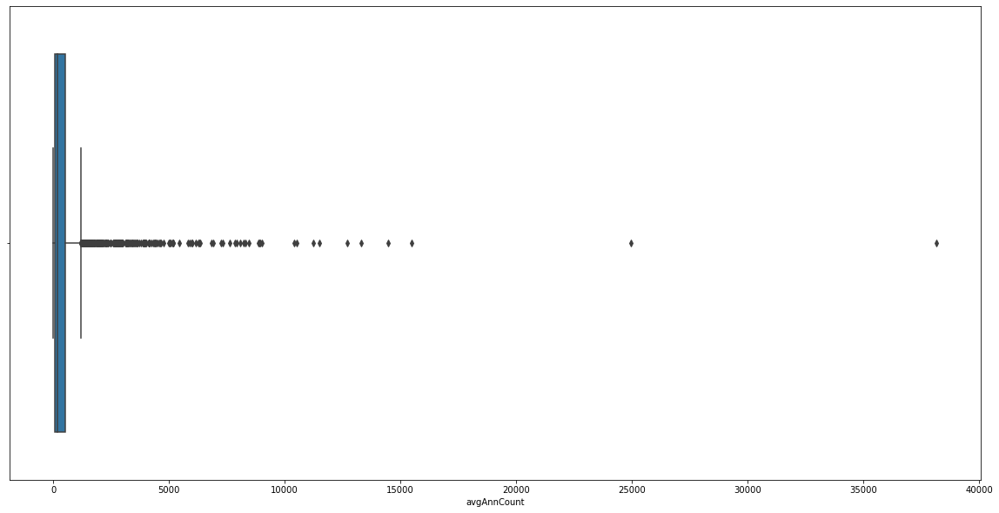

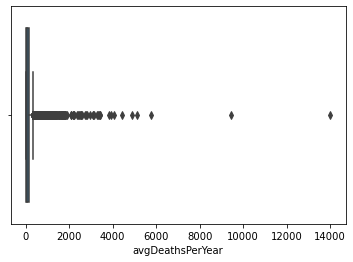

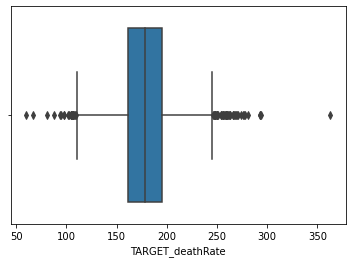

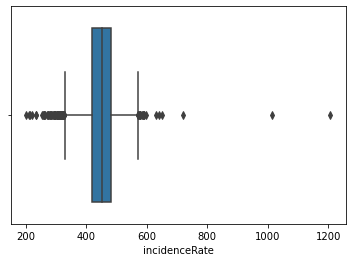

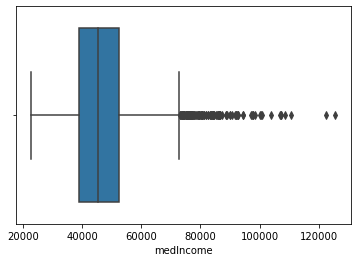

...

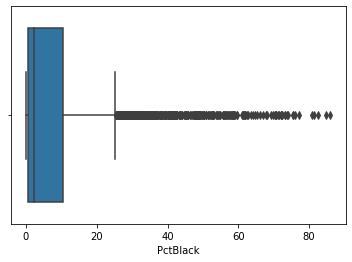

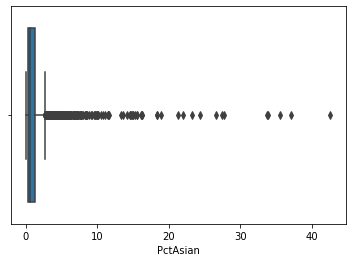

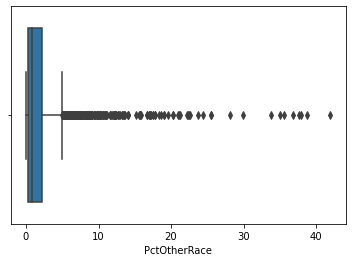

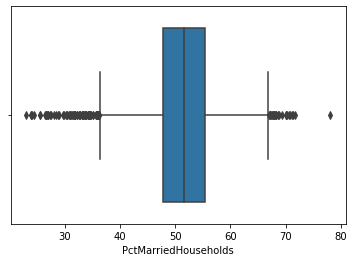

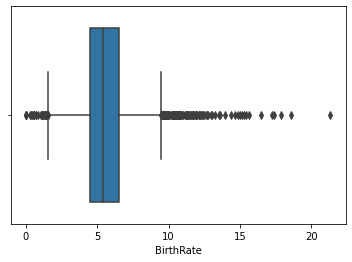

In [40]:
plt.figure(figsize = (20,10))

# detecting outliers by using boxplots

import warnings
warnings.filterwarnings("ignore")

for i in df_numeric.columns:
    sns.boxplot(i, data = df_numeric)
    plt.show()

In [65]:
# handling missing values

def handling_missing_values(x):
    x = x.fillna(x.mean())
    return x

df_missing_treatment = df_numeric.apply(handling_missing_values)

df_missing_treatment

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
0,1397.000000,469,164.9,489.800000,61898,260131,11.2,499.748204,39.3,36.9,...,48.453774,41.6,32.9,14.0,81.780529,2.594728,4.821857,1.843479,52.856076,6.118831
1,173.000000,70,161.3,411.600000,48127,43269,18.6,23.111234,33.0,32.2,...,53.800000,43.6,31.1,15.3,89.228509,0.969102,2.246233,3.741352,45.372500,4.333096
2,102.000000,50,174.7,349.700000,49348,21026,14.6,47.560164,45.0,44.0,...,43.500000,34.9,42.1,21.1,90.922190,0.739673,0.465898,2.747358,54.444868,3.729488
3,427.000000,202,194.8,430.400000,44243,75882,17.1,342.637253,42.8,42.2,...,40.300000,35.0,45.3,25.0,91.744686,0.782626,1.161359,1.362643,51.021514,4.603841
4,57.000000,26,144.4,350.100000,49955,10321,12.5,0.000000,48.3,47.8,...,43.900000,35.1,44.0,22.7,94.104024,0.270192,0.665830,0.492135,54.027460,6.796657
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3042,1962.667684,15,149.6,453.549422,46961,6343,12.4,0.000000,44.2,41.1,...,54.900000,44.6,31.7,13.2,90.280811,3.837754,0.327613,1.700468,51.063830,7.773512
3043,1962.667684,43,150.1,453.549422,48609,37118,18.8,377.175494,30.4,29.3,...,53.300000,48.6,28.8,17.7,75.706245,2.326771,4.044920,14.130288,52.007937,8.186470
3044,1962.667684,46,153.9,453.549422,51144,34536,15.0,1968.959926,30.9,30.5,...,52.600000,47.8,26.6,16.8,87.961629,2.313188,1.316472,5.680705,55.153949,7.809192
3045,1962.667684,52,175.0,453.549422,50745,25609,13.3,0.000000,39.0,36.9,...,56.300000,49.6,29.5,14.0,92.905681,1.176562,0.244632,2.131790,58.484232,7.582938


In [66]:
df_missing_treatment.isna().sum()

avgAnnCount                0
avgDeathsPerYear           0
TARGET_deathRate           0
incidenceRate              0
medIncome                  0
popEst2015                 0
povertyPercent             0
studyPerCap                0
MedianAge                  0
MedianAgeMale              0
MedianAgeFemale            0
AvgHouseholdSize           0
PercentMarried             0
PctNoHS18_24               0
PctHS18_24                 0
PctSomeCol18_24            0
PctBachDeg18_24            0
PctHS25_Over               0
PctBachDeg25_Over          0
PctEmployed16_Over         0
PctUnemployed16_Over       0
PctPrivateCoverage         0
PctPrivateCoverageAlone    0
PctEmpPrivCoverage         0
PctPublicCoverage          0
PctPublicCoverageAlone     0
PctWhite                   0
PctBlack                   0
PctAsian                   0
PctOtherRace               0
PctMarriedHouseholds       0
BirthRate                  0
dtype: int64

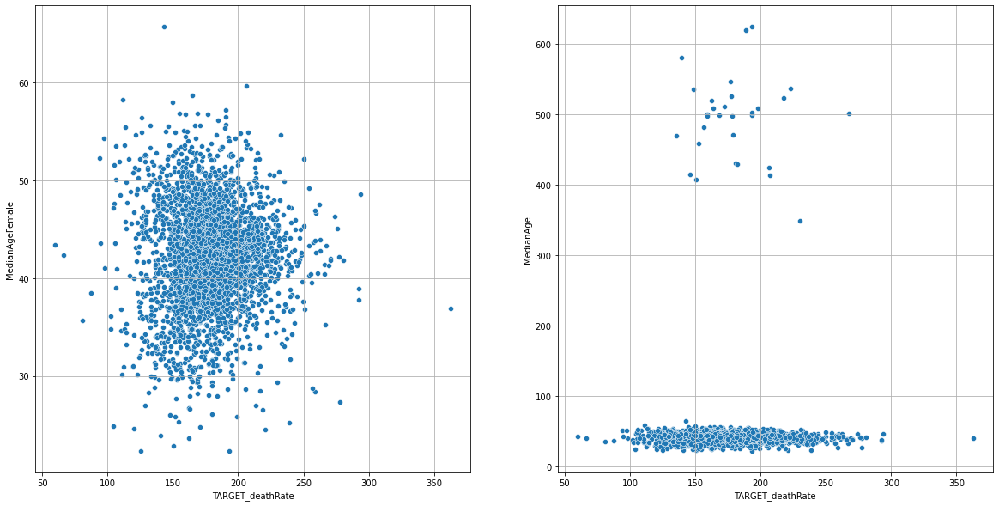

In [362]:


plt.subplot(1,2,1)
sns.scatterplot(y = 'MedianAgeFemale', x = 'TARGET_deathRate', data = final_data)

plt.subplot(1,2,2)
sns.scatterplot(y = 'MedianAge', x = 'TARGET_deathRate', data = final_data)
plt.show()

<Figure size 1440x720 with 0 Axes>

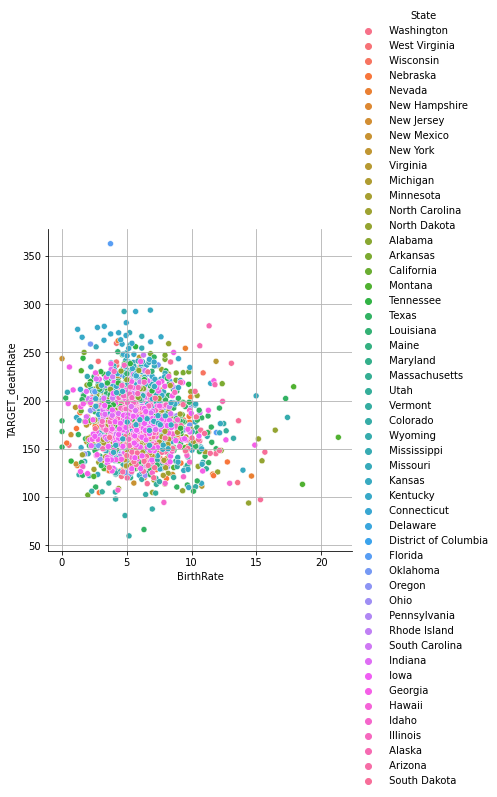

In [301]:


plt.figure(figsize = (20,10))
sns.relplot(x = 'BirthRate', y = 'TARGET_deathRate', hue = 'State', data = final_data,)
plt.show()


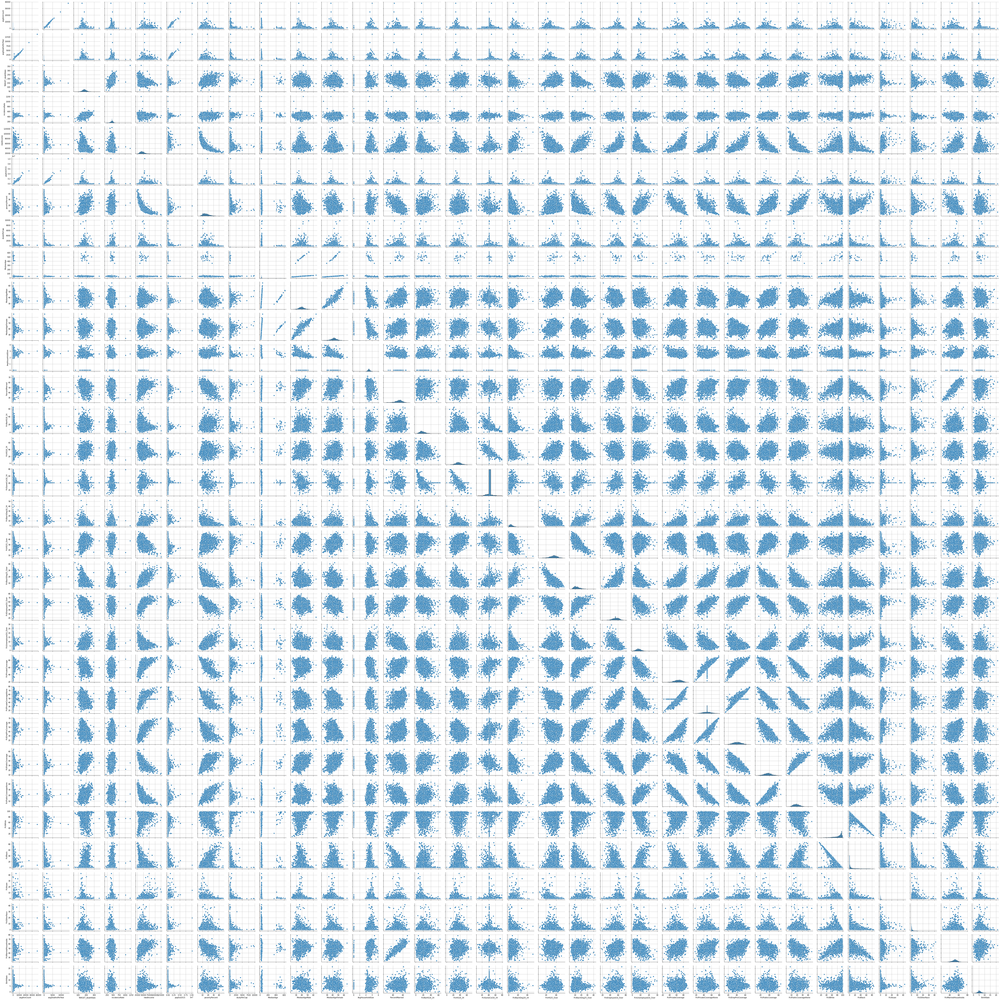

In [293]:
sns.pairplot(df_missing_outlier)

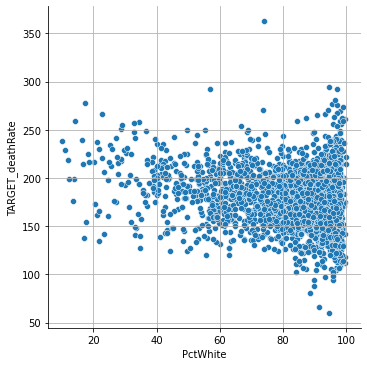

In [251]:
sns.relplot(x = 'PctWhite', y = 'TARGET_deathRate', data = df_missing_outlier)

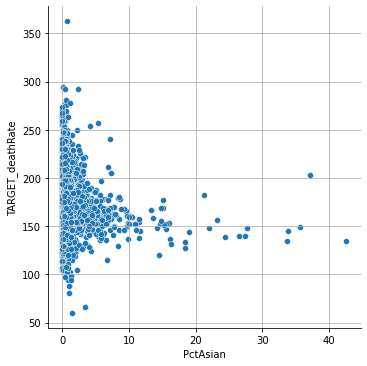

In [253]:
sns.relplot(x = 'PctAsian', y = 'TARGET_deathRate', data = df_missing_outlier)

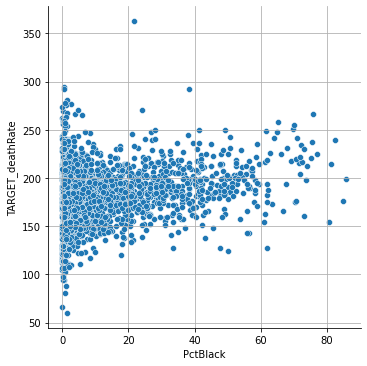

In [258]:
sns.relplot(x = 'PctBlack', y = 'TARGET_deathRate',  data = df_missing_outlier)

In [280]:
df_character[['City','State']] = data['Geography'].str.split(',',expand = True)

df_character[['bin_low','bin_upper']] = data['binnedInc'].str.split(',', expand = True)

df_character['bin_low'] = df_character['bin_low'].str.replace('(','').str.replace('[','').astype(float)


df_character['bin_upper'] = df_character['bin_upper'].str.replace(')','').str.replace(']','').astype(float)

Index(['binnedInc', 'Geography'], dtype='object')

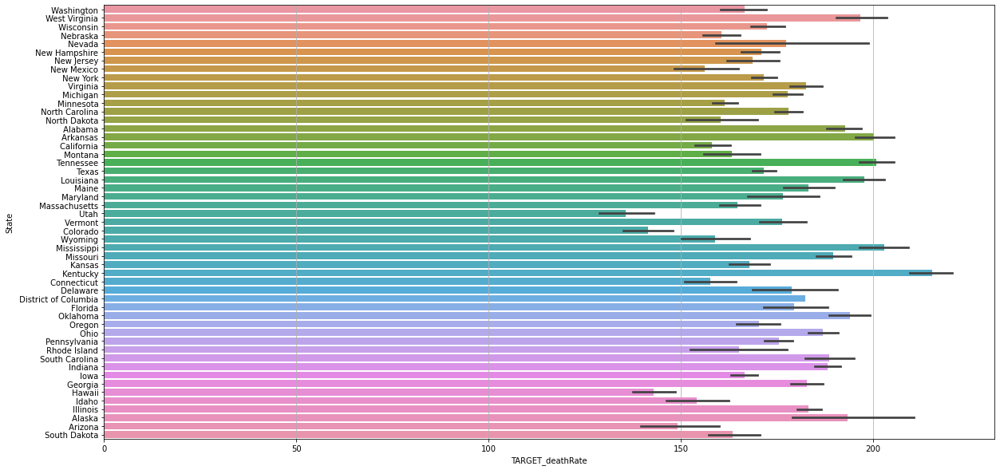

In [287]:
sns.barplot(x = 'TARGET_deathRate', y = 'State', data = final_data, )
df_character.columns

In [76]:
# handling outliers

def handling_outliers(x):
    x = x.clip(lower = x.quantile(0.01), upper = x.quantile(0.99))
    return x



df_missing_outlier_treatment = df_missing_treatment.apply(handling_outliers)

df_missing_outlier_treatment

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
0,1397.000000,469.0,164.9,489.800000,61898.0,260131.0,11.2,499.748204,39.3,36.9,...,48.453774,41.6,32.9,14.0,81.780529,2.594728,4.821857,1.843479,52.856076,6.118831
1,173.000000,70.0,161.3,411.600000,48127.0,43269.0,18.6,23.111234,33.0,32.2,...,53.800000,43.6,31.1,15.3,89.228509,0.969102,2.246233,3.741352,45.372500,4.333096
2,102.000000,50.0,174.7,349.700000,49348.0,21026.0,14.6,47.560164,45.0,44.0,...,43.500000,34.9,42.1,21.1,90.922190,0.739673,0.465898,2.747358,54.444868,3.729488
3,427.000000,202.0,194.8,430.400000,44243.0,75882.0,17.1,342.637253,42.8,42.2,...,40.300000,35.0,45.3,25.0,91.744686,0.782626,1.161359,1.362643,51.021514,4.603841
4,57.000000,26.0,144.4,350.100000,49955.0,10321.0,12.5,0.000000,48.3,47.8,...,43.900000,35.1,44.0,22.7,94.104024,0.270192,0.665830,0.492135,54.027460,6.796657
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3042,1962.667684,15.0,149.6,453.549422,46961.0,6343.0,12.4,0.000000,44.2,41.1,...,54.900000,44.6,31.7,13.2,90.280811,3.837754,0.327613,1.700468,51.063830,7.773512
3043,1962.667684,43.0,150.1,453.549422,48609.0,37118.0,18.8,377.175494,30.4,29.3,...,53.300000,48.6,28.8,17.7,75.706245,2.326771,4.044920,14.130288,52.007937,8.186470
3044,1962.667684,46.0,153.9,453.549422,51144.0,34536.0,15.0,1968.959926,30.9,30.5,...,52.600000,47.8,26.6,16.8,87.961629,2.313188,1.316472,5.680705,55.153949,7.809192
3045,1962.667684,52.0,175.0,453.549422,50745.0,25609.0,13.3,0.000000,39.0,36.9,...,56.300000,49.6,29.5,14.0,92.905681,1.176562,0.244632,2.131790,58.484232,7.582938


In [83]:

plt.rcParams["figure.figsize"] = (20,10)
plt.rcParams["axes.grid"] = True


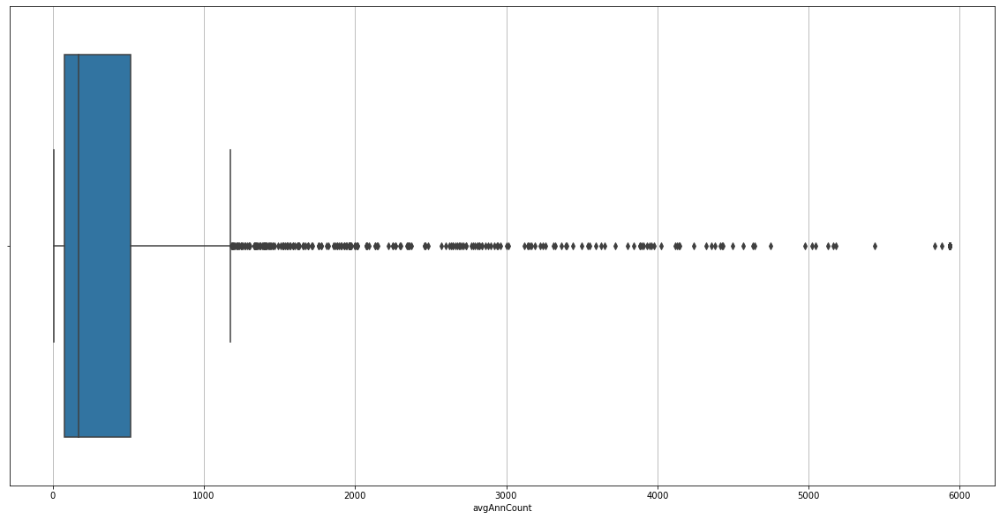

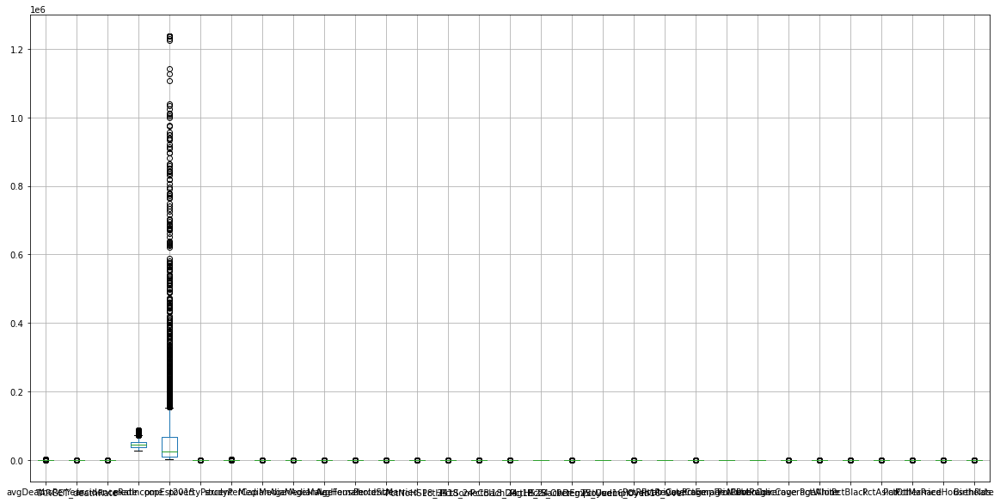

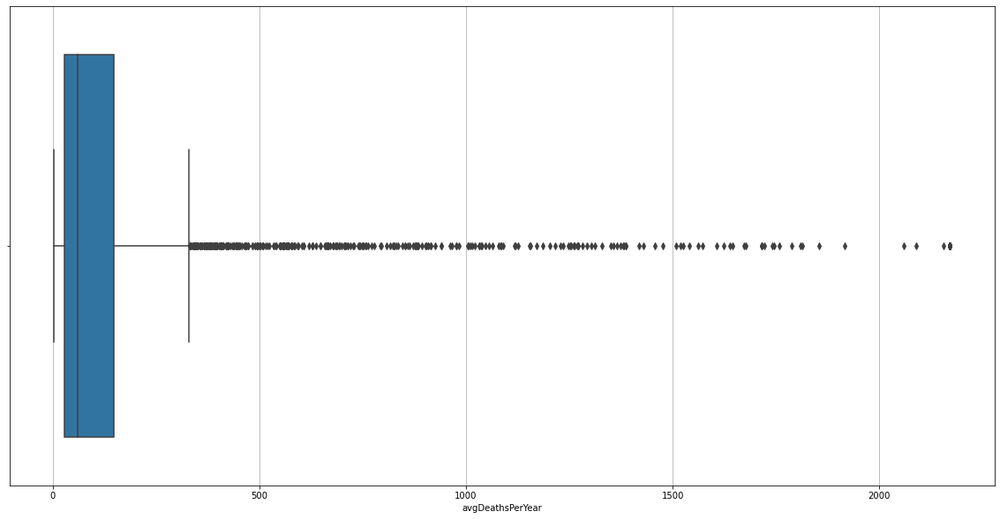

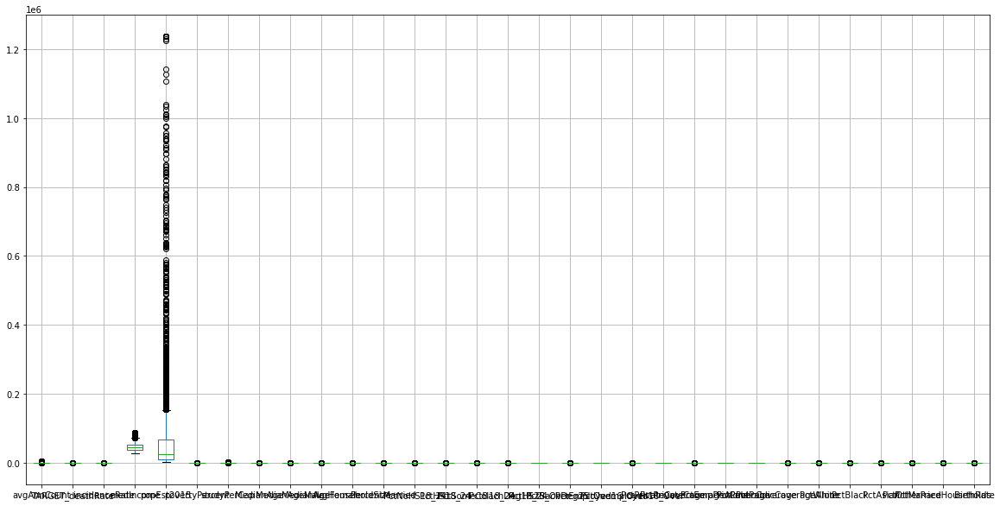

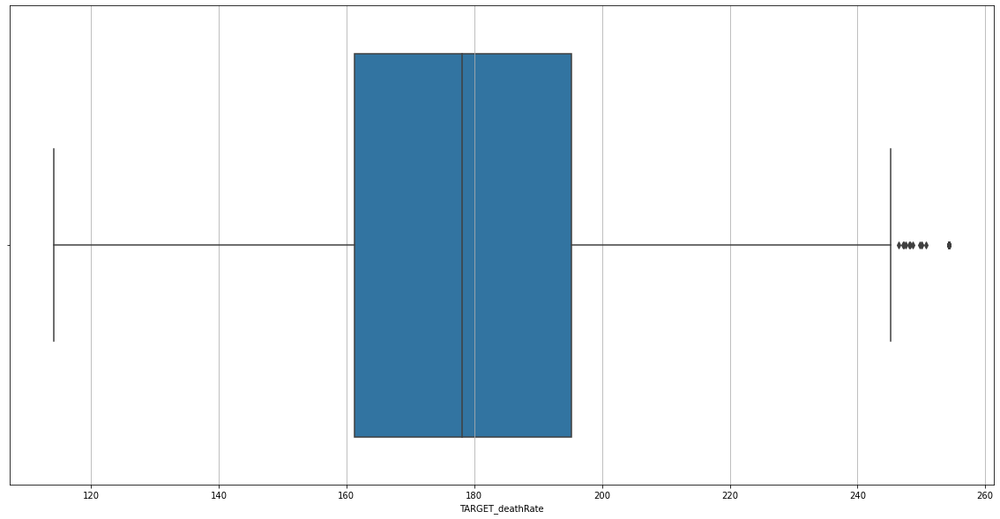

...

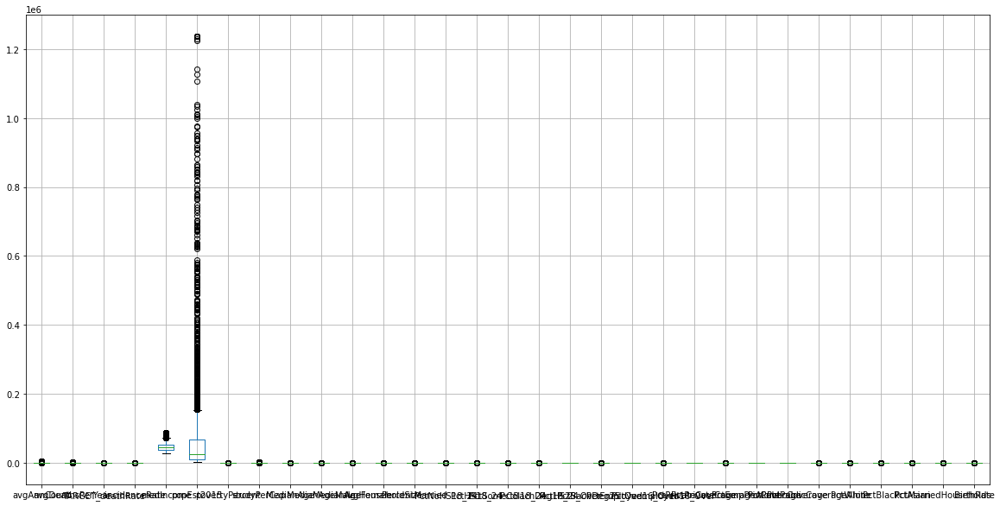

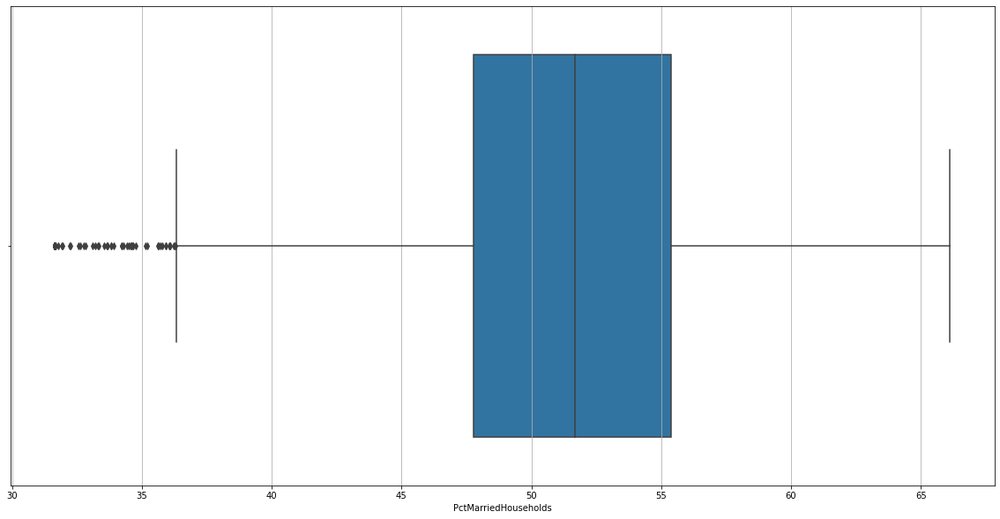

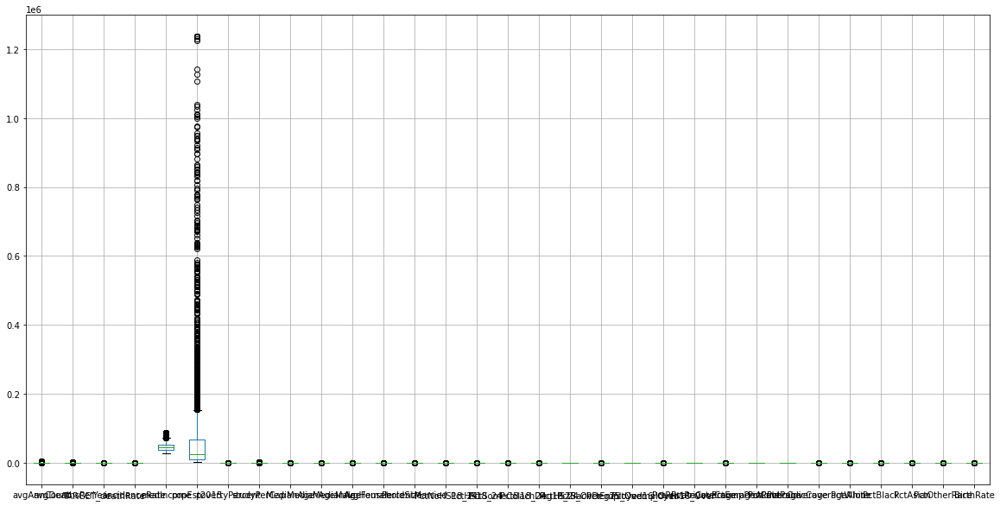

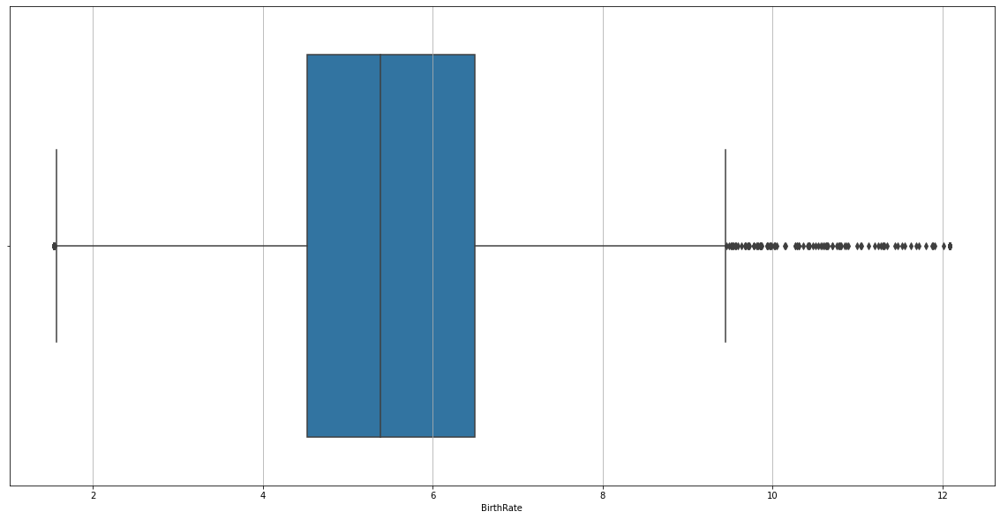

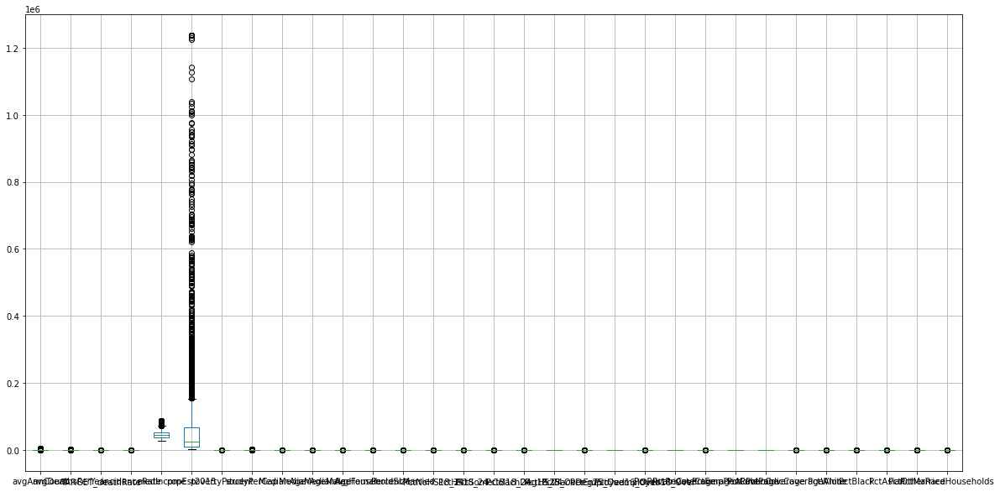

In [84]:
# displaying after handling outliers

for i in df_missing_outlier_treatment.columns:
    sns.boxplot(i, data = df_missing_outlier_treatment)
    plt.show()
    df_missing_outlier_treatment.plot(i,kind = 'box')
    plt.show()

In [90]:
def treat_outliers(x):
    q1 = np.percentile(x, 0.25)
    q2 = np.percentile(x, 0.50)
    q3 = np.percentile(x, 0.75)
    
    iqr = q3 - q1
    
    UL = q3 + 1.5*iqr
    LL = q1 - 1.5*iqr
    
    if x > UL:
        x = UL
    elif x < LL:
        x = LL
    else:
        x = x
    return x

In [94]:
df_missing_outlier = df_missing_treatment.applymap(lambda x: treat_outliers(x))

In [95]:
data.describe()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
count,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3.047000e+03,3047.000000,3047.000000,3047.000000,3047.000000,...,2438.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000
mean,606.338544,185.965868,178.664063,448.268586,47063.281917,1.026374e+05,16.878175,155.399415,45.272333,39.570725,...,48.453774,41.196324,36.252642,19.240072,83.645286,9.107978,1.253965,1.983523,51.243872,5.640306
std,1416.356223,504.134286,27.751511,54.560733,12040.090836,3.290592e+05,6.409087,529.628366,45.304480,5.226017,...,10.083006,9.447687,7.841741,6.113041,16.380025,14.534538,2.610276,3.517710,6.572814,1.985816
min,6.000000,3.000000,59.700000,201.300000,22640.000000,8.270000e+02,3.200000,0.000000,22.300000,22.400000,...,15.700000,13.500000,11.200000,2.600000,10.199155,0.000000,0.000000,0.000000,22.992490,0.000000
25%,76.000000,28.000000,161.200000,420.300000,38882.500000,1.168400e+04,12.150000,0.000000,37.700000,36.350000,...,41.000000,34.500000,30.900000,14.850000,77.296180,0.620675,0.254199,0.295172,47.763063,4.521419
50%,171.000000,61.000000,178.100000,453.549422,45207.000000,2.664300e+04,15.900000,0.000000,41.000000,39.600000,...,48.700000,41.100000,36.300000,18.800000,90.059774,2.247576,0.549812,0.826185,51.669941,5.381478
75%,518.000000,149.000000,195.200000,480.850000,52492.000000,6.867100e+04,20.400000,83.650776,44.000000,42.500000,...,55.600000,47.700000,41.550000,23.100000,95.451693,10.509732,1.221037,2.177960,55.395132,6.493677
max,38150.000000,14010.000000,362.800000,1206.900000,125635.000000,1.017029e+07,47.400000,9762.308998,624.000000,64.700000,...,78.900000,70.700000,65.100000,46.600000,100.000000,85.947799,42.619425,41.930251,78.075397,21.326165


In [96]:
df_missing_outlier.describe()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
count,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3.047000e+03,3047.000000,3047.000000,3047.000000,3047.000000,...,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000
mean,606.338544,185.965868,178.664063,448.268586,47063.281917,1.026374e+05,16.878175,155.399415,45.272333,39.570725,...,48.453774,41.196324,36.252642,19.240072,83.645286,9.107978,1.253965,1.983523,51.243872,5.640306
std,1416.356223,504.134286,27.751511,54.560733,12040.090836,3.290592e+05,6.409087,529.628366,45.304480,5.226017,...,9.018885,9.447687,7.841741,6.113041,16.380025,14.534538,2.610276,3.517710,6.572814,1.985816
min,6.000000,3.000000,59.700000,201.300000,22640.000000,8.270000e+02,3.200000,0.000000,22.300000,22.400000,...,15.700000,13.500000,11.200000,2.600000,10.199155,0.000000,0.000000,0.000000,22.992490,0.000000
25%,76.000000,28.000000,161.200000,420.300000,38882.500000,1.168400e+04,12.150000,0.000000,37.700000,36.350000,...,43.100000,34.500000,30.900000,14.850000,77.296180,0.620675,0.254199,0.295172,47.763063,4.521419
50%,171.000000,61.000000,178.100000,453.549422,45207.000000,2.664300e+04,15.900000,0.000000,41.000000,39.600000,...,48.453774,41.100000,36.300000,18.800000,90.059774,2.247576,0.549812,0.826185,51.669941,5.381478
75%,518.000000,149.000000,195.200000,480.850000,52492.000000,6.867100e+04,20.400000,83.650776,44.000000,42.500000,...,53.800000,47.700000,41.550000,23.100000,95.451693,10.509732,1.221037,2.177960,55.395132,6.493677
max,38150.000000,14010.000000,362.800000,1206.900000,125635.000000,1.017029e+07,47.400000,9762.308998,624.000000,64.700000,...,78.900000,70.700000,65.100000,46.600000,100.000000,85.947799,42.619425,41.930251,78.075397,21.326165


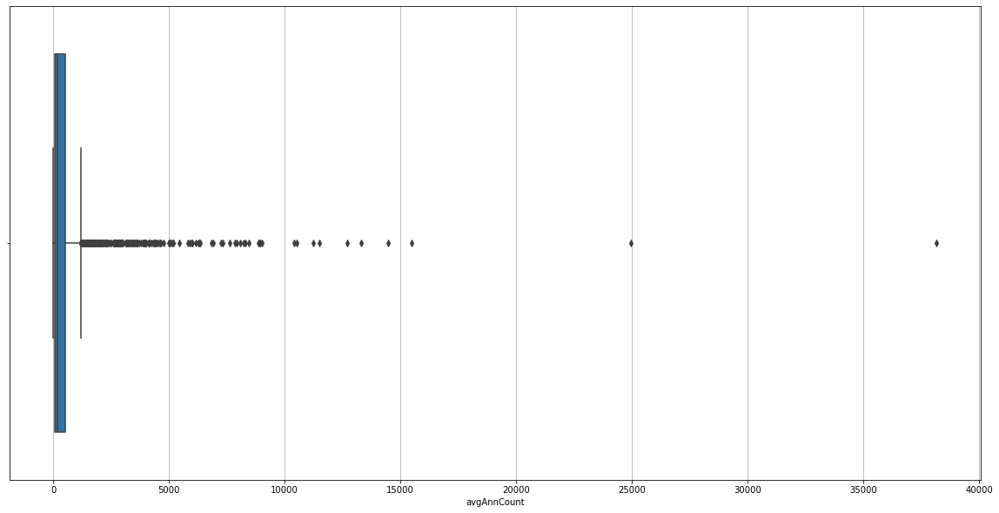

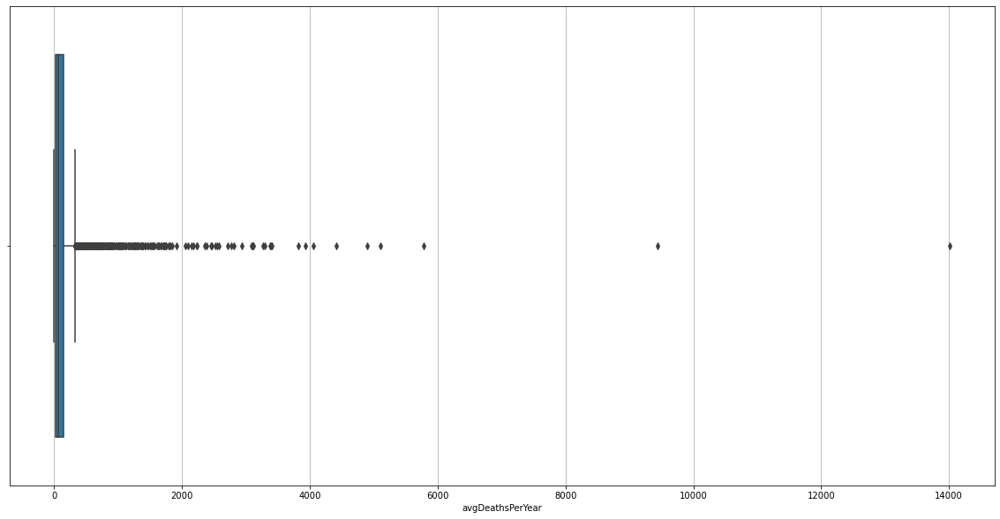

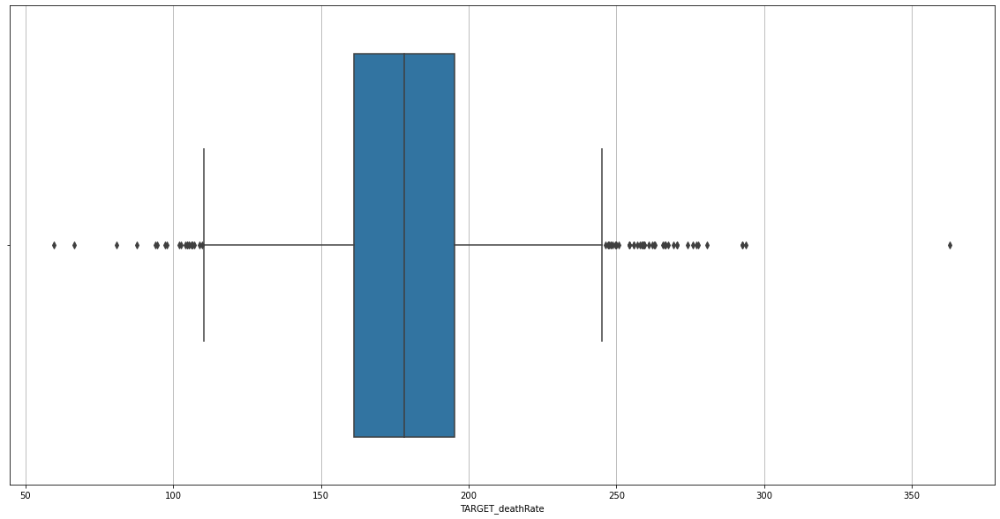

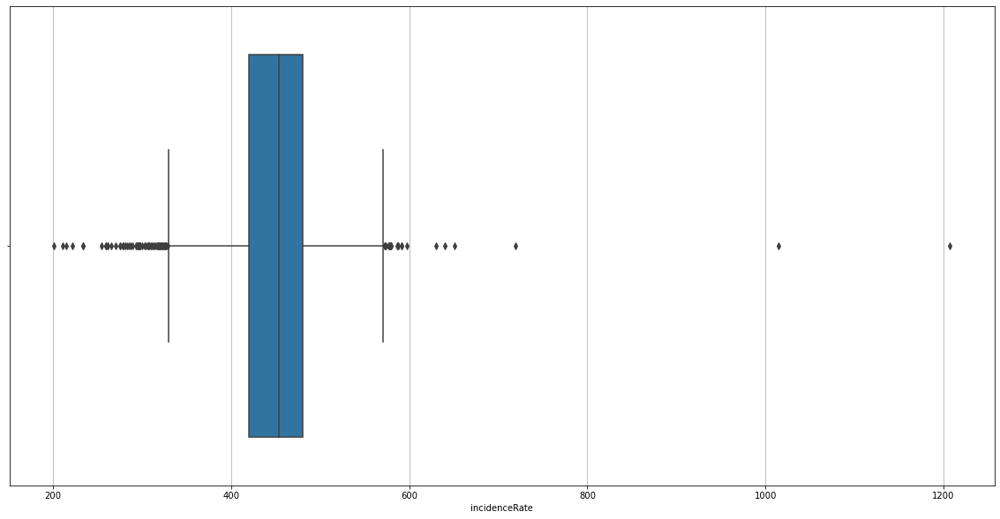

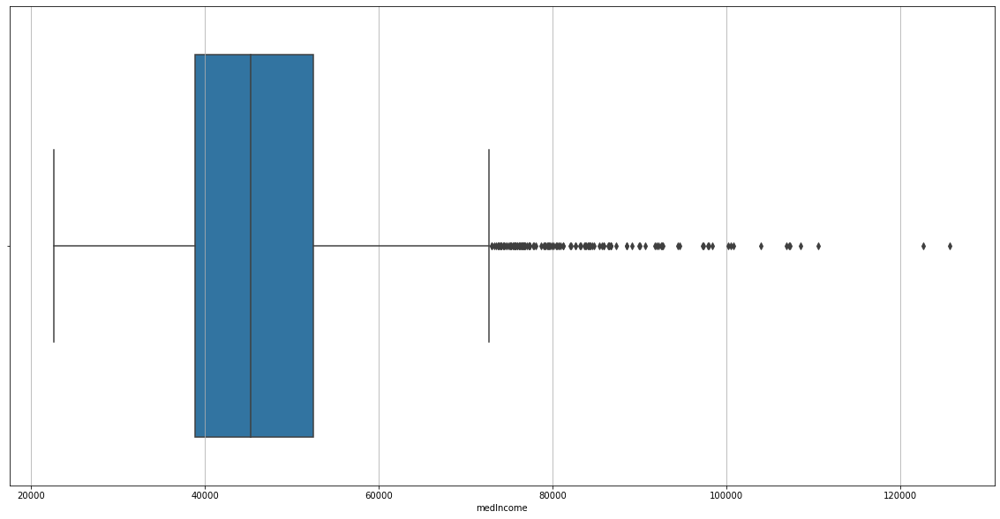

...

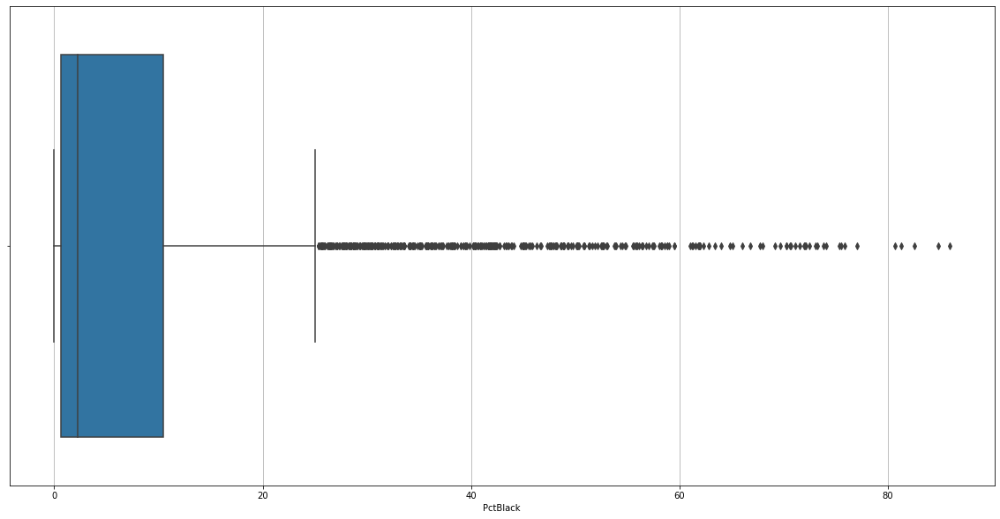

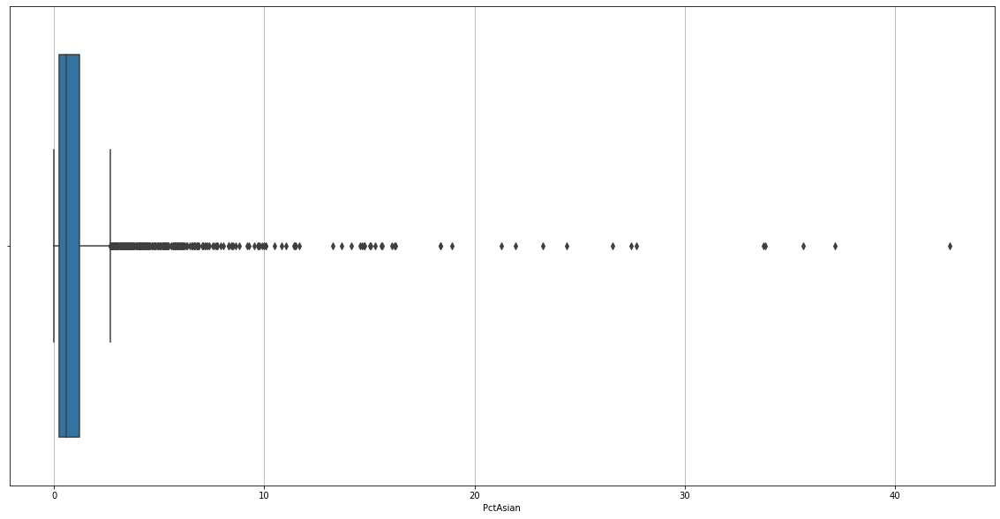

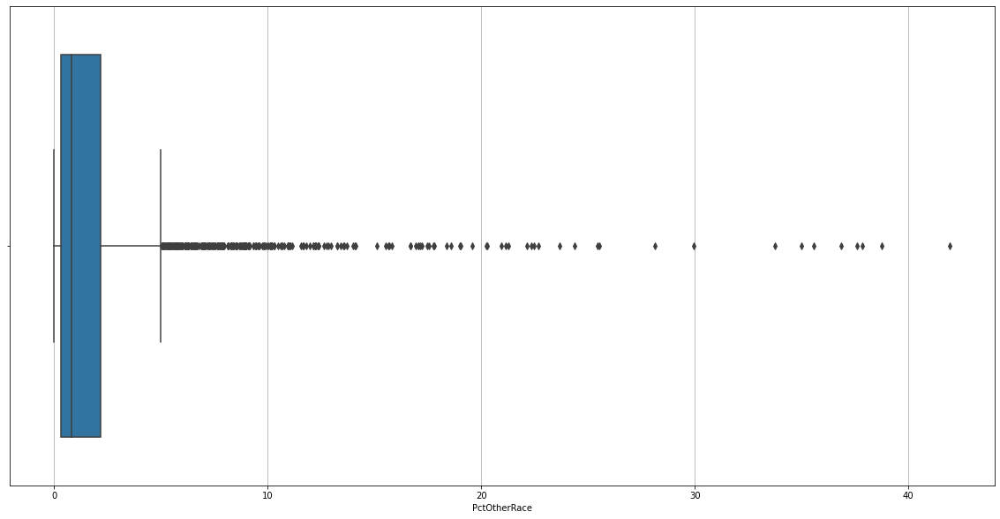

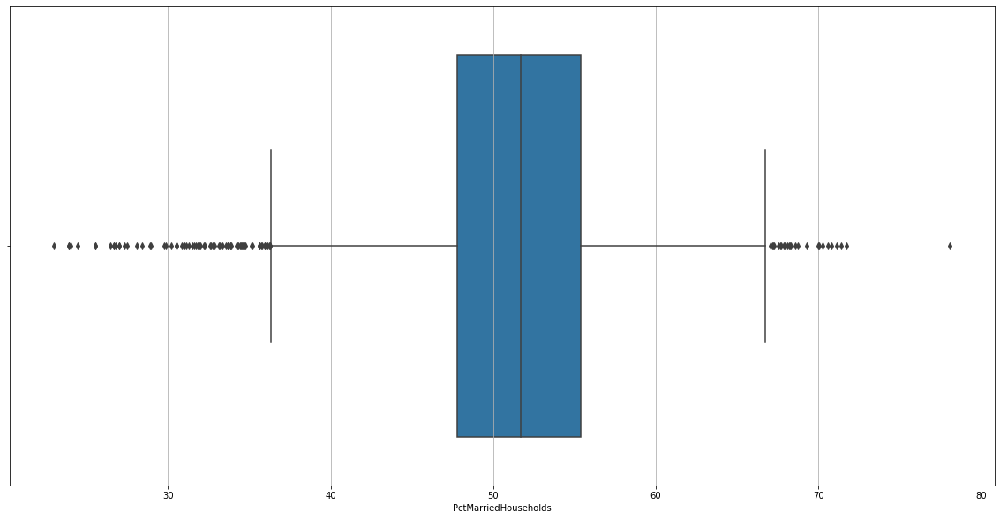

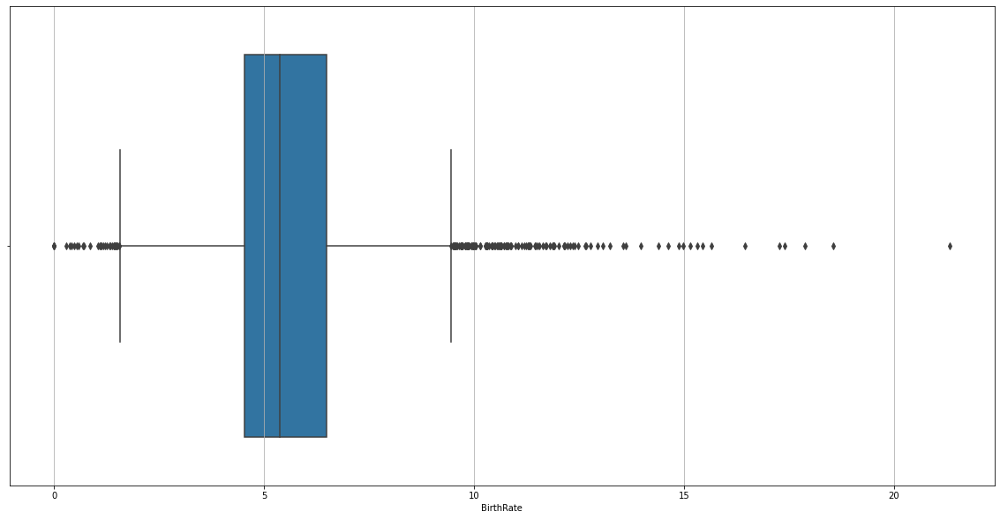

In [100]:
for i in df_missing_outlier.columns:
    sns.boxplot(i, data = df_missing_outlier)
    plt.show()

In [285]:
df_character = data.select_dtypes(['object'])



In [176]:

df_character

,binnedInc,Geography
0,"(61494.5, 125635]","Kitsap County, Washington"
1,"(48021.6, 51046.4]","Kittitas County, Washington"
2,"(48021.6, 51046.4]","Klickitat County, Washington"
3,"(42724.4, 45201]","Lewis County, Washington"
4,"(48021.6, 51046.4]","Lincoln County, Washington"
...,...,...
3042,"(45201, 48021.6]","Ellsworth County, Kansas"
3043,"(48021.6, 51046.4]","Finney County, Kansas"
3044,"(51046.4, 54545.6]","Ford County, Kansas"
3045,"(48021.6, 51046.4]","Franklin County, Kansas"


In [281]:
final_data = pd.concat([df_missing_outlier,df_character], axis = 1)

In [283]:
final_data.head()

final_data.drop(['binnedInc','Geography'], axis = 1, inplace = True)

In [284]:
final_data.head()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,...,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate,City,State,bin_low,bin_upper
0,1397.0,469,164.9,489.8,61898,260131,11.2,499.748204,39.3,36.9,...,81.780529,2.594728,4.821857,1.843479,52.856076,6.118831,Kitsap County,Washington,61494.5,125635.0
1,173.0,70,161.3,411.6,48127,43269,18.6,23.111234,33.0,32.2,...,89.228509,0.969102,2.246233,3.741352,45.372500,4.333096,Kittitas County,Washington,48021.6,51046.4
2,102.0,50,174.7,349.7,49348,21026,14.6,47.560164,45.0,44.0,...,90.922190,0.739673,0.465898,2.747358,54.444868,3.729488,Klickitat County,Washington,48021.6,51046.4
3,427.0,202,194.8,430.4,44243,75882,17.1,342.637253,42.8,42.2,...,91.744686,0.782626,1.161359,1.362643,51.021514,4.603841,Lewis County,Washington,42724.4,45201.0
4,57.0,26,144.4,350.1,49955,10321,12.5,0.000000,48.3,47.8,...,94.104024,0.270192,0.665830,0.492135,54.027460,6.796657,Lincoln County,Washington,48021.6,51046.4


In [178]:
df_missing_outlier.columns

features = df_missing_outlier[df_missing_outlier.columns.difference(['TARGET_deathRate'])]
target = df_missing_outlier['TARGET_deathRate']

In [181]:
pd.DataFrame(features.corrwith(target), columns = ['Correlation']).sort_values('Correlation', ascending=False)

,Correlation
incidenceRate,0.449432
PctPublicCoverageAlone,0.449358
povertyPercent,0.429389
PctHS25_Over,0.404589
PctPublicCoverage,0.404572
PctUnemployed16_Over,0.378412
PctHS18_24,0.261976
PctBlack,0.257024
PctNoHS18_24,0.088463
MedianAgeFemale,0.012048


In [183]:
pd.DataFrame(features.apply(lambda x: x.std()/x.mean()*100), columns = ['Coefficient_Variation']).sort_values('Coefficient_Variation', ascending = False)

,Coefficient_Variation
studyPerCap,340.817477
popEst2015,320.603713
avgDeathsPerYear,271.089685
avgAnnCount,233.591652
PctAsian,208.161828
PctOtherRace,177.346576
PctBlack,159.580299
MedianAge,100.071007
PctBachDeg18_24,73.544146
PctNoHS18_24,44.407729


In [187]:
import statsmodels
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [193]:
vif = pd.DataFrame()
vif['features'] = features.columns
vif['VIF'] = [variance_inflation_factor(features.values,i) for i in range(features.shape[1])]
vif.sort_values('VIF',ascending=False)

,features,VIF
3,MedianAgeFemale,679.147841
23,PercentMarried,603.626433
16,PctPrivateCoverage,598.363981
18,PctPublicCoverage,588.454626
4,MedianAgeMale,564.688470
13,PctMarriedHouseholds,519.187339
19,PctPublicCoverageAlone,260.505584
22,PctWhite,183.105566
10,PctEmployed16_Over,180.947622
9,PctEmpPrivCoverage,158.051460


In [211]:
from sklearn.feature_selection import SelectKBest, f_regression,f_classif,RFE
from sklearn.ensemble import RandomForestRegressor

In [212]:
rfe = RFE(RandomForestRegressor(), n_features_to_select = 15, verbose=True)
rfe.fit(features,target)

Fitting estimator with 31 features.
Fitting estimator with 30 features.
Fitting estimator with 29 features.
Fitting estimator with 28 features.
Fitting estimator with 27 features.
Fitting estimator with 26 features.
Fitting estimator with 25 features.
Fitting estimator with 24 features.
Fitting estimator with 23 features.
Fitting estimator with 22 features.
Fitting estimator with 21 features.
Fitting estimator with 20 features.
Fitting estimator with 19 features.
Fitting estimator with 18 features.
Fitting estimator with 17 features.
Fitting estimator with 16 features.


RFE(estimator=RandomForestRegressor(), n_features_to_select=15, verbose=True)

In [216]:
best_features = features.columns[rfe.get_support()]
best_features

Index(['AvgHouseholdSize', 'PctBachDeg25_Over', 'PctBlack', 'PctHS18_24',
       'PctHS25_Over', 'PctMarriedHouseholds', 'PctOtherRace',
       'PctPrivateCoverage', 'PctPublicCoverageAlone', 'PctUnemployed16_Over',
       'avgDeathsPerYear', 'incidenceRate', 'medIncome', 'popEst2015',
       'povertyPercent'],
      dtype='object')

In [196]:
skb = SelectKBest(f_regression, k = 15).fit(features,target)

In [215]:
best_columns = features.columns[skb.get_support()]
best_columns

Index(['PctBachDeg18_24', 'PctBachDeg25_Over', 'PctEmpPrivCoverage',
       'PctEmployed16_Over', 'PctHS25_Over', 'PctMarriedHouseholds',
       'PctPrivateCoverage', 'PctPrivateCoverageAlone', 'PctPublicCoverage',
       'PctPublicCoverageAlone', 'PctUnemployed16_Over', 'PercentMarried',
       'incidenceRate', 'medIncome', 'povertyPercent'],
      dtype='object')

In [229]:
top_features = list(set(list(best_columns)+list(best_features)))
top_features

['PctOtherRace',
 'PctPublicCoverage',
 'povertyPercent',
 'PctPublicCoverageAlone',
 'PctMarriedHouseholds',
 'PctPrivateCoverage',
 'popEst2015',
 'incidenceRate',
 'PctBachDeg25_Over',
 'PercentMarried',
 'AvgHouseholdSize',
 'PctBachDeg18_24',
 'PctHS25_Over',
 'PctUnemployed16_Over',
 'PctHS18_24',
 'medIncome',
 'PctPrivateCoverageAlone',
 'PctBlack',
 'PctEmpPrivCoverage',
 'PctEmployed16_Over',
 'avgDeathsPerYear']

<AxesSubplot:xlabel='TARGET_deathRate', ylabel='Density'>

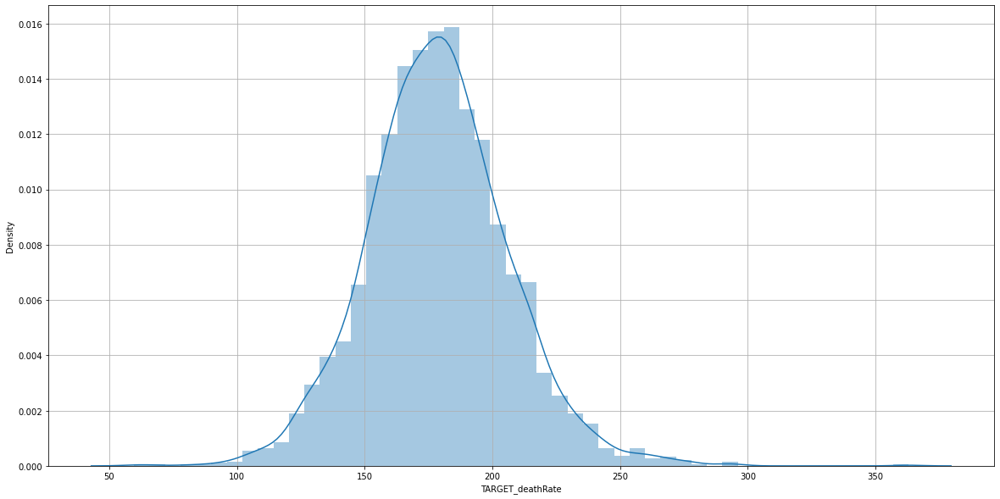

In [200]:
sns.distplot(target)

In [230]:
features_15 = features[top_features]

In [204]:
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor

In [302]:
x_train,x_test,y_train,y_test = train_test_split(features_15,target, random_state=135,test_size=0.3)

In [303]:
xgb_model = XGBRegressor()

In [304]:
xgb_model.fit(x_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [305]:
pred_train = xgb_model.predict(x_train)
pred_test = xgb_model.predict(x_test)

In [306]:
from sklearn.metrics import r2_score,mean_absolute_error,mean_absolute_percentage_error,mean_squared_error

In [307]:

print("MSE : ",mean_squared_error(y_train,pred_train))
print("MAE : ",mean_absolute_error(y_train,pred_train))
print("MAPE : ",mean_absolute_percentage_error(y_train,pred_train))
print("R2 : ",r2_score(y_train,pred_train))

print("MSE : ",mean_squared_error(y_test,pred_test))
print("MAE : ",mean_absolute_error(y_test,pred_test))
print("MAPE : ",mean_absolute_percentage_error(y_test,pred_test))
print("R2 : ",r2_score(y_test,pred_test))

MSE :  2.064894217424905
MAE :  1.035338821912125
MAPE :  0.005857993426894754
R2 :  0.9973088154155562
MSE :  328.95689084897174
MAE :  13.339775749164852
MAPE :  0.07718588276467112
R2 :  0.576048202258941


# Different types of Algorithms in Linear Regression

In [308]:
rfr_model = RandomForestRegressor()

rfr_model.fit(x_train,y_train)

pred_train = rfr_model.predict(x_train)
pred_test = rfr_model.predict(x_test)


print("MSE : ",mean_squared_error(y_train,pred_train))
print("MAE : ",mean_absolute_error(y_train,pred_train))
print("MAPE : ",mean_absolute_percentage_error(y_train,pred_train))
print("R2 : ",r2_score(y_train,pred_train))

print("MSE : ",mean_squared_error(y_test,pred_test))
print("MAE : ",mean_absolute_error(y_test,pred_test))
print("MAPE : ",mean_absolute_percentage_error(y_test,pred_test))
print("R2 : ",r2_score(y_test,pred_test))

MSE :  50.01740997889296
MAE :  5.174719981238268
MAPE :  0.029950872056455198
R2 :  0.9348121169825014
MSE :  359.0057435606556
MAE :  14.112511475409834
MAPE :  0.08247420075855662
R2 :  0.537321957326673


In [311]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import MinMaxScaler

scale = MinMaxScaler()

scale.fit(x_train)

x_train_scaled = scale.transform(x_train)
x_test_scaled = scale.transform(x_test)

knn_model = KNeighborsRegressor()

knn_model.fit(x_train_scaled,y_train)

pred_train = knn_model.predict(x_train_scaled)
pred_test = knn_model.predict(x_test_scaled)


print("MSE : ",mean_squared_error(y_train,pred_train))
print("MAE : ",mean_absolute_error(y_train,pred_train))
print("MAPE : ",mean_absolute_percentage_error(y_train,pred_train))
print("R2 : ",r2_score(y_train,pred_train))

print("MSE : ",mean_squared_error(y_test,pred_test))
print("MAE : ",mean_absolute_error(y_test,pred_test))
print("MAPE : ",mean_absolute_percentage_error(y_test,pred_test))
print("R2 : ",r2_score(y_test,pred_test))

MSE :  288.24346622889306
MAE :  12.671848030018761
MAPE :  0.07406935989984585
R2 :  0.6243311805825882
MSE :  462.38439606557375
MAE :  15.978666666666669
MAPE :  0.09511501179047269
R2 :  0.40409001479341844


In [315]:
from sklearn.ensemble import AdaBoostRegressor

adb_model = AdaBoostRegressor()

adb_model.fit(x_train,y_train)

pred_train = adb_model.predict(x_train)
pred_test = adb_model.predict(x_test)


print("MSE : ",mean_squared_error(y_train,pred_train))
print("MAE : ",mean_absolute_error(y_train,pred_train))
print("MAPE : ",mean_absolute_percentage_error(y_train,pred_train))
print("R2 : ",r2_score(y_train,pred_train))

print("MSE : ",mean_squared_error(y_test,pred_test))
print("MAE : ",mean_absolute_error(y_test,pred_test))
print("MAPE : ",mean_absolute_percentage_error(y_test,pred_test))
print("R2 : ",r2_score(y_test,pred_test))

MSE :  365.8215231810801
MAE :  15.261034420587578
MAPE :  0.09042463114588245
R2 :  0.5232234002425407
MSE :  451.2458169973153
MAE :  16.284536772532253
MAPE :  0.0972472425385856
R2 :  0.4184451499239884


In [316]:
from sklearn.ensemble import GradientBoostingRegressor

gb_model = GradientBoostingRegressor()

gb_model.fit(x_train,y_train)

pred_train = gb_model.predict(x_train)
pred_test = gb_model.predict(x_test)


print("MSE : ",mean_squared_error(y_train,pred_train))
print("MAE : ",mean_absolute_error(y_train,pred_train))
print("MAPE : ",mean_absolute_percentage_error(y_train,pred_train))
print("R2 : ",r2_score(y_train,pred_train))

print("MSE : ",mean_squared_error(y_test,pred_test))
print("MAE : ",mean_absolute_error(y_test,pred_test))
print("MAPE : ",mean_absolute_percentage_error(y_test,pred_test))
print("R2 : ",r2_score(y_test,pred_test))

MSE :  187.04142814162
MAE :  10.523410907465239
MAPE :  0.06047362244415361
R2 :  0.7562281865001187
MSE :  329.00459492004734
MAE :  13.676894129133125
MAPE :  0.07948820862500022
R2 :  0.5759867223895275


In [317]:
from sklearn.ensemble import BaggingRegressor

bag_reg_model = BaggingRegressor()

bag_reg_model.fit(x_train,y_train)

pred_train = bag_reg_model.predict(x_train)
pred_test = bag_reg_model.predict(x_test)


print("MSE : ",mean_squared_error(y_train,pred_train))
print("MAE : ",mean_absolute_error(y_train,pred_train))
print("MAPE : ",mean_absolute_percentage_error(y_train,pred_train))
print("R2 : ",r2_score(y_train,pred_train))

print("MSE : ",mean_squared_error(y_test,pred_test))
print("MAE : ",mean_absolute_error(y_test,pred_test))
print("MAPE : ",mean_absolute_percentage_error(y_test,pred_test))
print("R2 : ",r2_score(y_test,pred_test))

MSE :  67.58848250469045
MAE :  5.7756988742964355
MAPE :  0.03338638423465153
R2 :  0.9119116705022252
MSE :  382.40258120218573
MAE :  14.755213114754099
MAPE :  0.08571558411444932
R2 :  0.5071686708155344


In [336]:


from keras.models import Sequential
from keras.layers import Dense

model = Sequential()

model.add(Dense(10, activation = 'relu',kernel_initializer = 'normal', input_dim = 21))

model.add(Dense(5, activation = 'relu', kernel_initializer = 'normal'))

model.add(Dense(1, activation = 'relu', kernel_initializer = 'normal'))

model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_9 (Dense)             (None, 10)                220       
                                                                 
 dense_10 (Dense)            (None, 5)                 55        
                                                                 
 dense_11 (Dense)            (None, 1)                 6         
                                                                 
Total params: 281
Trainable params: 281
Non-trainable params: 0
_________________________________________________________________


In [337]:
x_train.shape

(2132, 21)

In [338]:
model.compile(optimizer='adam',loss='mean_squared_error', metrics = ['mse'])


history = model.fit(x_train,y_train, epochs=50, validation_data = [x_test,y_test])

Epoch 1/50
67/67 [==============================] - ETA: 0s - loss: 23037.5684 - mse: 23037.5684 - 1s 3ms/step - loss: 17970.6621 - mse: 17970.6621 - val_loss: 5404.2280 - val_mse: 5404.2280
Epoch 2/50
67/67 [==============================] - 0s 2ms/step - loss: 3790.1042 - mse: 3790.1042 - val_loss: 3376.4468 - val_mse: 3376.4468
Epoch 3/50
67/67 [==============================] - 0s 2ms/step - loss: 3406.8691 - mse: 3406.8691 - val_loss: 3413.4138 - val_mse: 3413.4138
Epoch 4/50
67/67 [==============================] - 0s 2ms/step - loss: 3490.9702 - mse: 3490.9702 - val_loss: 3536.9768 - val_mse: 3536.9768
Epoch 5/50
67/67 [==============================] - 0s 2ms/step - loss: 3371.5886 - mse: 3371.5886 - val_loss: 3235.2429 - val_mse: 3235.2429
Epoch 6/50
67/67 [==============================] - 0s 2ms/step - loss: 3528.9639 - mse: 3528.9639 - val_loss: 3545.1438 - val_mse: 3545.1438
Epoch 7/50
67/67 [==============================] - 0s 2ms/step - loss: 3218.3184 - mse: 3218.3184 